In [1]:
import os
import h5py
import shutil
from astropy.nddata.utils import Cutout2D
from astropy.io import fits
from astropy import table
import numpy as np
import matplotlib.pyplot as plt
from astropy.visualization import (ZScaleInterval, ImageNormalize)


In [2]:
scratch = os.path.expandvars("$SCRATCH") + '/'
image_dir = "/home/anahoban/projects/rrg-kyi/astro/cfis/W3/"

In [17]:
hf.close()

In [18]:
tile_list = open(image_dir + "tiles.list", "r")
hf = h5py.File(scratch + "test.h5", "w")
hf.close()

In [42]:
os.remove(os.path.expandvars("$SLURM_TMPDIR") + "/test.h5")

In [43]:
#intitialize file in tmpdir, to work there
src = os.path.expandvars("$SCRATCH") + "/test.h5"
dest = os.path.expandvars("$SLURM_TMPDIR") + "/"
shutil.copy2(src, dest)

'/localscratch/anahoban.3932896.0/test.h5'

In [44]:
hf = h5py.File(dest + "test.h5", "r+")

In [45]:
inorms = []
wnorms = []

In [40]:
def create_cutouts(img, wt, x, y, band):
    ''' Creates the image and weight cutouts given a tile, the position of the center and the band '''
    
    img_cutout = Cutout2D(img.data, (x, y), cutout_size, mode="partial", fill_value=0).data
    if np.count_nonzero(np.isnan(img_cutout)) >= 0.05*cutout_size**2 or np.count_nonzero(img_cutout) == 0: # Don't use this cutout
        return (None, None)
    wt_cutout = Cutout2D(wt.data, (x, y), cutout_size, mode="partial", fill_value=0).data
    img_cutout[np.isnan(img_cutout)] = 0
    wt_cutout[np.isnan(wt_cutout)] = 0
    
    #img_lower = np.percentile(img_cutout, 1)
    #img_upper = np.percentile(img_cutout, 99)
    
    img_lower = np.percentile(img_cutout, 0.001)
    #img_lower = np.min(img_cutout)
    img_upper = np.percentile(img_cutout, 99.999)
    
    img_cutout[img_cutout<img_lower] = img_lower
    img_cutout[img_cutout>img_upper] = img_upper
    #wt_cutout[wt_cutout<img_lower] = img_lower
    #wt_cutout[wt_cutout>img_upper] = img_upper
    
    
    if img_lower == img_upper:
        img_norm = np.zeros((cutout_size, cutout_size))
        inorms.append(-1)
    else:
        img_norm = (img_cutout - np.min(img_cutout)) / (img_upper - img_lower)
        inorms.append(1/(img_upper - img_lower))
        
    if (band != "u" or band != "r") and img_upper != img_lower: # Alter weights for PS1
        wt_norm = (wt_cutout - np.min(wt_cutout)) / (img_upper - img_lower)
        wnorms.append(1/(img_upper - img_lower))
    else: # Do not alter weights for CFIS
        wt_norm = wt_cutout
        wnorms.append(-1)
        
    return (img_norm, wt_norm)

In [25]:
u_images = []; u_weights = []
r_images = []; r_weights = []
u_cat = []
r_cat = []
for tile in tile_list:
    tile = tile[:-1] # Remove new line character
    channels = tile.split(" ") #tile.channel tile.channel ... (we just want tiles with all 5 channels)
    if len(channels) == 5: # Order is u,g,r,i,z
        u_images.append(image_dir + channels[0] + ".fits")
        u_weights.append(image_dir + channels[0] + ".weight.fits.fz")
        r_images.append(image_dir + channels[2] + ".fits")
        r_weights.append(image_dir + channels[2] + ".weight.fits.fz")
        
        u_cat.append(image_dir + channels[0] + ".cat")
        r_cat.append(image_dir + channels[2] + ".cat")
tile_list.close()

In [26]:
# Copy tiles to $SLURM_TMPDIR
start = 0
end = 3
for n in range(start, end):
    shutil.copy2(u_images[n], dest)
    shutil.copy2(u_weights[n], dest)
    shutil.copy2(r_images[n], dest)
    shutil.copy2(r_weights[n], dest)
    #shutil.copy2(u_cat[n], dest)
    shutil.copy2(r_cat[n], dest)
    
    u_images[n] = os.path.abspath(dest + os.path.basename(u_images[n]))
    u_weights[n] = os.path.abspath(dest + os.path.basename(u_weights[n]))
    r_images[n] = os.path.abspath(dest + os.path.basename(r_images[n]))
    r_weights[n] = os.path.abspath(dest + os.path.basename(r_weights[n])) 
    #u_cat[n] = os.path.abspath(dest + os.path.basename(u_cat[n]))
    r_cat[n] = os.path.abspath(dest + os.path.basename(r_cat[n]))

In [10]:
len(u_cat)

41

In [46]:
cutout_size = 64
start = 0
end = 3
img_cutout = np.zeros((cutout_size, cutout_size, 5))
wt_cutout = np.zeros((cutout_size, cutout_size, 5))
for n in range(start, end):
    root = os.path.basename(u_images[n])[5:12] + "/" # XXX.XXX id
    
    u_image = fits.open(u_images[n], memmap=True)
    u_weight = fits.open(u_weights[n], memmap=True)
    r_image = fits.open(r_images[n], memmap=True)
    r_weight = fits.open(r_weights[n], memmap=True)
    main_cat = table.Table.read(r_cat[n], format="ascii.sextractor")
    #app_cat = table.Table.read(u_cat[n], format="ascii.sextractor")
    
    img_group = hf.create_group(root + "IMAGES")
    wt_group = hf.create_group(root + "WEIGHTS")

    count = 0
    #cutouts from r band
    for i in range(len(main_cat)): #each cutout in tile
        if main_cat["FLAGS"][i] != 0 or main_cat["MAG_AUTO"][i] >= 99.0 or main_cat["MAGERR_AUTO"][i] <= 0 or main_cat["MAGERR_AUTO"][i] >= 1:
            continue
        
        x = main_cat["X_IMAGE"][i]
        y = main_cat["Y_IMAGE"][i]
        
        (r_img, r_wt) = create_cutouts(r_image[0], r_weight[1], x, y, "r")
        if r_img is None:
            continue
        (u_img, u_wt) = create_cutouts(u_image[0], u_weight[1], x, y, "u")
        if u_img is None:
            continue
        img_cutout[:,:,0] = u_img
        img_cutout[:,:,2] = r_img
        wt_cutout[:,:,0] = u_wt
        wt_cutout[:,:,2] = r_wt
 

        img_group.create_dataset(f"c{count}", data=img_cutout)
        wt_group.create_dataset(f"c{count}", data=wt_cutout)
        count += 1
    
    u_image.close()
    u_weight.close()
    r_image.close()
    r_weight.close()
    
    print(f"Tile {n+1} completed")

Tile 1 completed
Tile 2 completed
Tile 3 completed


In [55]:
hf.get('180.272/IMAGES/c0')

<HDF5 dataset "c0": shape (64, 64, 5), type "<f8">

In [47]:
print(len(inorms), len(wnorms))

143395 143395


2.3387279018791668e-05 0.08680109709210702


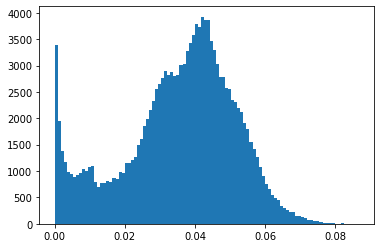

In [48]:
plt.hist(inorms, bins =100);
print(np.min(inorms),np.max(inorms))

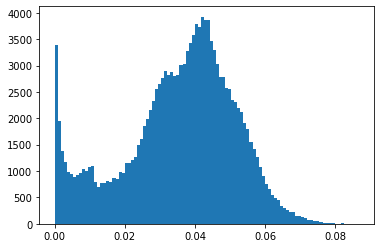

In [49]:
plt.hist(wnorms, bins=100);

## Catalogue filtering

In [10]:
cat_r = table.Table.read(r_cat[0], format="ascii.sextractor")

In [18]:
cat_r.keys()

['NUMBER',
 'X_IMAGE',
 'Y_IMAGE',
 'ALPHA_J2000',
 'DELTA_J2000',
 'MAG_AUTO',
 'MAGERR_AUTO',
 'MAG_BEST',
 'MAGERR_BEST',
 'MAG_APER',
 'MAGERR_APER',
 'A_WORLD',
 'ERRA_WORLD',
 'B_WORLD',
 'ERRB_WORLD',
 'THETA_J2000',
 'ERRTHETA_J2000',
 'ISOAREA_IMAGE',
 'MU_MAX',
 'FLUX_RADIUS',
 'FLAGS']

In [17]:
cat_r['FLAGS']

0
3
2
0
8
0
0
18
0
0
0


In [20]:
u_flags = []
r_flags = []

for n in range(0, 20):
    #root = os.path.basename(u_images[n])[5:12] + "/" # XXX.XXX id
    
    cat_r = table.Table.read(r_cat[n], format="ascii.sextractor")
    cat_u = table.Table.read(u_cat[n], format="ascii.sextractor")
    
    for i in range(len(cat_r)): #each cutout in tile
        r_flags.append(cat_r["FLAGS"][i])
        
    for i in range(len(cat_u)): #each cutout in tile
        u_flags.append(cat_u["FLAGS"][i])
    #if main_cat["FLAGS"][i] != 0 or main_cat["MAG_AUTO"][i] >= 99.0 or main_cat["MAGERR_AUTO"][i] <= 0 or main_cat["MAGERR_AUTO"][i] >= 1:
        #continue

(array([1.63493e+05, 1.10000e+01, 0.00000e+00, 4.50400e+03, 2.99000e+02,
        1.80000e+01, 1.00000e+00, 0.00000e+00, 0.00000e+00, 3.00000e+00]),
 array([ 0. ,  5.1, 10.2, 15.3, 20.4, 25.5, 30.6, 35.7, 40.8, 45.9, 51. ]),
 <BarContainer object of 10 artists>)

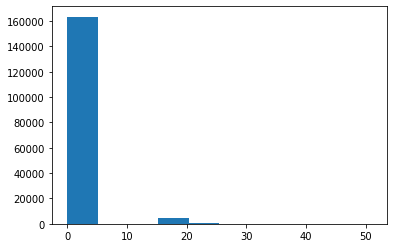

In [29]:
plt.hist(u_flags,)

(array([6.19668e+05, 5.60000e+01, 4.53900e+03, 2.18500e+03, 2.03000e+02,
        6.90000e+01, 0.00000e+00, 5.00000e+00, 1.26000e+02, 7.00000e+00]),
 array([ 0. ,  6.2, 12.4, 18.6, 24.8, 31. , 37.2, 43.4, 49.6, 55.8, 62. ]),
 <BarContainer object of 10 artists>)

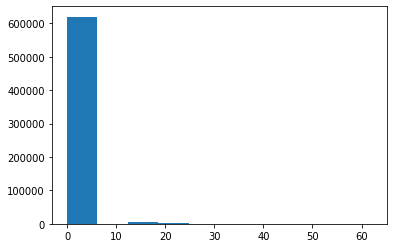

In [28]:
plt.hist(r_flags)

# Testing jobs

In [3]:
import os
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.visualization import (ZScaleInterval, ImageNormalize)
import tensorflow as tf
from tensorflow import keras
import tensorflow.keras.backend as K
from functions import plot_loss_curves
%load_ext autoreload
from func_job1 import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
import tensorflow.keras.load_model

ModuleNotFoundError: No module named 'tensorflow.keras.load_model'

In [8]:
cutout_dir = os.path.expandvars("$SCRATCH") + "/"
image_dir = "/home/anahoban/projects/rrg-kyi/astro/cfis/W3/"

In [9]:
#get tile ids
tile_list = open(image_dir + "tiles.list", "r")

# Only use tiles with all five channels
tile_list = open(image_dir + "tiles.list", "r")
tile_ids = []

for tile in tile_list:
    tile = tile[:-1] # Remove new line character
    channels = tile.split(" ")
    if len(channels) == 5: # Order is u,g,r,i,z
        tile_ids.append(channels[0][5:12]) # XXX.XXX id
tile_list.close()

In [10]:
hf= h5py.File(cutout_dir + "cutouts_filtered_64p_r.h5", "r")

In [11]:
BATCH_SIZE = 256 #128
CUTOUT_SIZE = 64
N_EPOCHS = 10

In [12]:
def get_test_cutouts(index, n_cutouts, cutout_size, bands="cfis", start=0):
    n = 0
    if bands == "all":
        band_indices = [0, 1, 2, 3, 4]
        l = len(band_indices)
        sources = np.zeros((n_cutouts, cutout_size, cutout_size, l))
        weights = np.zeros((n_cutouts, cutout_size, cutout_size, l))
        
        
    elif bands == "cfis":
        band_indices = [2]
        l = len(band_indices)
        sources = np.zeros((n_cutouts, cutout_size, cutout_size, l))
        weights = np.zeros((n_cutouts, cutout_size, cutout_size, l))
        
    else: # PS1
        band_indices = [1, 3, 4]
        l = len(band_indices)
        sources = np.zeros((n_cutouts, cutout_size, cutout_size, l))
        weights = np.zeros((n_cutouts, cutout_size, cutout_size, l))
        
    img_group = hf.get(tile_ids[index] + "/IMAGES")
    wt_group = hf.get(tile_ids[index] + "/WEIGHTS")
    for i in range(start, len(img_group)):
        sources[n,:,:,:] = np.array(img_group.get(f"c{i}"))[:,:,band_indices]
        weights[n,:,:,:] = np.array(wt_group.get(f"c{i}"))[:,:,band_indices]
        n += 1
        if n == n_cutouts:
            #return sources #if no weights
            return np.concatenate((sources, weights),axis=-1) #if we train with weights

In [46]:
test_index = 18
sources_test_cfis = get_test_cutouts(test_index, 50, CUTOUT_SIZE, "cfis")
sources_test_cfis.shape

(50, 64, 64, 2)

In [14]:
bands=1
def masked_MSE_with_uncertainty(y_true, y_pred): 
    weights = y_pred[...,bands:] 
    y_pred_image = y_pred[...,:bands]
    
    return K.square(tf.math.multiply((y_true - y_pred_image), weights) ) #no weights

In [15]:
autoencoder_cfis = create_autoencoder2((CUTOUT_SIZE, CUTOUT_SIZE, bands)) #last is the number of channels
autoencoder_cfis.compile(optimizer="adam", loss=MSE_with_uncertainty)

NameError: name 'MSE_with_uncertainty' is not defined

In [16]:
autoencoder_cfis = keras.models.load_model("../Models/autoencoder_r_only", custom_objects={'masked_MSE_with_uncertainty': masked_MSE_with_uncertainty})
#or
#autoencoder_cfis.load_weights("../Models/autoencoder_cfis_128p_job3")

In [49]:
history_cfis = pd.read_csv("../Histories/history_r_only.csv")

In [29]:
autoencoder_cfis

In [47]:
decoded_imgs_cfis = autoencoder_cfis.predict(sources_test_cfis)
residuals_cfis = sources_test_cfis - decoded_imgs_cfis

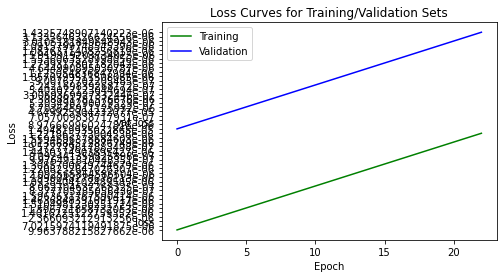

In [50]:
plot_loss_curves(history_cfis, figname="loss_ronly.png")

Text(0.5, 1.0, '128p, 10 tiles, u and r with weights loss curves')

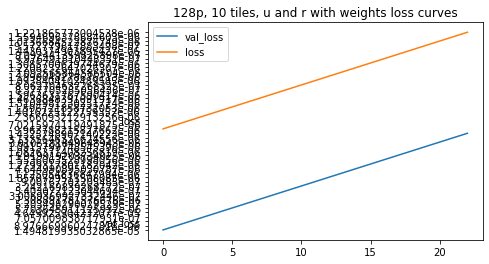

In [28]:
plt.plot(range(len(history_all)),history_all['val_loss'], label = 'val_loss')
plt.plot(range(len(history_all)),history_all['loss'], label = 'loss')
plt.legend()
plt.title('64p, 10 tiles, u and r with weights loss curves')

In [36]:
bands = ['r']

In [54]:
def plot_images(images_true, images_pred, images_res, bands, figname):
   
    fig,axes = plt.subplots(images_true.shape[0], len(bands)*4, figsize =(30,200))
    plt.setp(axes, xticks=[], yticks=[])
    
    for img in range(images_true.shape[0]):
        for bd in range(len(bands)):
            norm_true  = ImageNormalize(images_true[img,:,:,bd], interval=ZScaleInterval())
            norm_pred  = ImageNormalize(images_pred[img,:,:,bd], interval=ZScaleInterval())
            
            weighted_res = images_res[img,:,:,bd]*images_true[img,:,:,bd+1]
            norm_wres  = ImageNormalize( weighted_res, interval=ZScaleInterval())
            
            imw = axes[img][bd].imshow(images_true[img,:,:,bd+1])
            im1 = axes[img][bd+1].imshow(images_true[img,:,:,bd], norm = norm_true)
            im2 = axes[img][bd+2].imshow(images_pred[img,:,:,bd], norm = norm_pred)
            im3 = axes[img][bd+3].imshow(weighted_res, norm = norm_wres)

            if img == 0:
                axes[img][bd].set_title(bands[bd])                
                #axes[img][bd].set_title(bands[bd])
                axes[img][bd+1].set_title(bands[bd])                
                axes[img][bd+2].set_title(bands[bd])
                axes[img][bd+3].set_title(bands[bd])                
                #axes[img][bd+4].set_title(bands[bd])
                #axes[img][bd+6].set_title(bands[bd])                
                #axes[img][bd+6].set_title(bands[bd])
    plt.savefig("../Plots/" + figname)

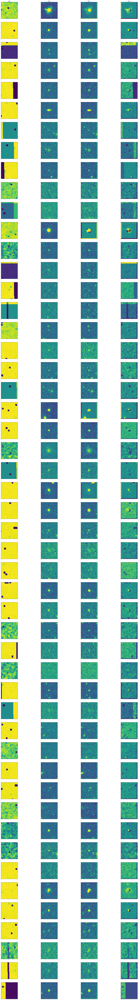

In [55]:
bands = ['cfis r']
plot_images(sources_test_cfis[...], decoded_imgs_cfis[...], residuals_cfis[...], bands, figname = 'job4_test')